**Assignment - Advanced Regression**

---


**Overview and Problem Statement**:



*   A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price.
*   The company is looking at prospective properties to buy to enter the market. A regression model is required to build using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.
* The company wants to know:
  1. Which variables are significant in predicting the price of a house.
  2. How well those variables describe the price of a house.

**Importing required libraries and loading the dataset**

---

In [189]:
# Load all required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
import statsmodels.api as sm
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings(action="ignore")

In [190]:
# Configure the option to display all columns and rows of the DataFrame.
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

In [191]:
# Importing data
df_house = pd.read_csv('train.csv')

**Following steps have been followed in this assignment**
1. Reading, understanding, cleaning and visualising the data(EDA).
2. Preparing the data for modelling.
3. Model building and evaluation(Linear, Ridge & Lasso).
4. Observations after regularization.

**Step 1: Reading, understanding, cleaning and visualising the data**

In [192]:
# View shape/dimension of the dataset
df_house.shape

(1460, 81)

In [193]:
# View the data
# 'SalePrice' is the target variable
df_house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [194]:
# View data description
df_house.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [195]:
# View column-wise information of the dataset.
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [196]:
# View the percentage of missing values.
df_house.isnull().mean()*100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [197]:
# Drop columns that are either unique identifier columns or have more than 60% missing values.
df_house = df_house.drop(['Id','Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis=1)

In [198]:
# Check the number of unique values for each column.
df_house.nunique()

MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
Street              2
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          4
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        637
BsmtFinType2        6
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          753
2ndFlrSF          417
LowQualFinSF       24
GrLivArea         861
BsmtFullBa

In [199]:
# View column-wise information of the dataset.
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [200]:
#Use the mode to handle missing values in categorical data columns.
MasVnrType_mode = df_house['MasVnrType'].mode()[0]
df_house['MasVnrType'] = df_house['MasVnrType'].fillna(MasVnrType_mode)

BsmtQual_mode = df_house['BsmtQual'].mode()[0]
df_house['BsmtQual'] = df_house['BsmtQual'].fillna(BsmtQual_mode)

BsmtCond_mode = df_house['BsmtCond'].mode()[0]
df_house['BsmtCond'] = df_house['BsmtCond'].fillna(BsmtCond_mode)

BsmtExposure_mode = df_house['BsmtExposure'].mode()[0]
df_house['BsmtExposure'] = df_house['BsmtExposure'].fillna(BsmtExposure_mode)

BsmtFinType1_mode = df_house['BsmtFinType1'].mode()[0]
df_house['BsmtFinType1'] = df_house['BsmtFinType1'].fillna(BsmtFinType1_mode)

BsmtFinType2_mode = df_house['BsmtFinType2'].mode()[0]
df_house['BsmtFinType2'] = df_house['BsmtFinType2'].fillna(BsmtFinType2_mode)

Electrical_mode = df_house['Electrical'].mode()[0]
df_house['Electrical'] = df_house['Electrical'].fillna(Electrical_mode)

GarageType_mode = df_house['GarageType'].mode()[0]
df_house['GarageType'] = df_house['GarageType'].fillna(GarageType_mode)

GarageYrBlt_mode = df_house['GarageYrBlt'].mode()[0]
df_house['GarageYrBlt'] = df_house['GarageYrBlt'].fillna(GarageYrBlt_mode)

GarageFinish_mode = df_house['GarageFinish'].mode()[0]
df_house['GarageFinish'] = df_house['GarageFinish'].fillna(GarageFinish_mode)

GarageQual_mode = df_house['GarageQual'].mode()[0]
df_house['GarageQual'] = df_house['GarageQual'].fillna(GarageQual_mode)

GarageCond_mode = df_house['GarageCond'].mode()[0]
df_house['GarageCond'] = df_house['GarageCond'].fillna(GarageCond_mode)

#Use the median to handle missing values in numeric data columns.
LotFrontage_median = df_house['LotFrontage'].median()
df_house['LotFrontage'] = df_house['LotFrontage'].fillna(LotFrontage_median)

MasVnrArea_median = df_house['MasVnrArea'].median()
df_house['MasVnrArea'] = df_house['MasVnrArea'].fillna(MasVnrArea_median)

In [201]:
# View column-wise information of the dataset.
df_house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   LotShape       1460 non-null   object 
 6   LandContour    1460 non-null   object 
 7   Utilities      1460 non-null   object 
 8   LotConfig      1460 non-null   object 
 9   LandSlope      1460 non-null   object 
 10  Neighborhood   1460 non-null   object 
 11  Condition1     1460 non-null   object 
 12  Condition2     1460 non-null   object 
 13  BldgType       1460 non-null   object 
 14  HouseStyle     1460 non-null   object 
 15  OverallQual    1460 non-null   int64  
 16  OverallCond    1460 non-null   int64  
 17  YearBuilt      1460 non-null   int64  
 18  YearRemo

In [202]:
# Visualize numerical/continuous variables.
sns.pairplot(df_house, vars=['SalePrice', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd',
                             'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
                             '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea',
                             'GarageYrBlt', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
                             'ScreenPorch', 'PoolArea', 'MiscVal', 'OverallQual', 'OverallCond',
                             'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
                             'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'YrSold'])
plt.show()

<Axes: xlabel='SaleCondition', ylabel='SalePrice'>

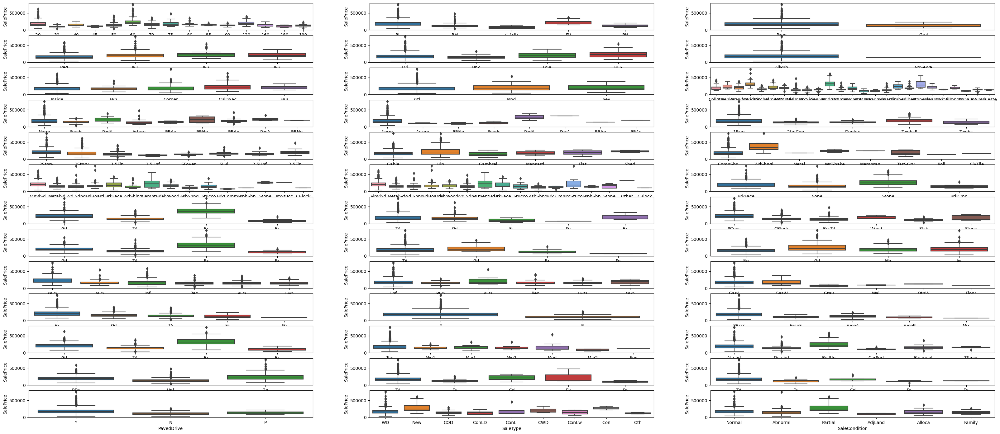

In [203]:
# Visualize categorical variables.
plt.figure(figsize=(40, 24))
plt.subplot(18, 3, 1)
sns.boxplot(x='MSSubClass', y='SalePrice', data=df_house)
plt.subplot(18, 3, 2)
sns.boxplot(x='MSZoning', y='SalePrice', data=df_house)
plt.subplot(18, 3, 3)
sns.boxplot(x='Street', y='SalePrice', data=df_house)

plt.subplot(18, 3, 4)
sns.boxplot(x='LotShape', y='SalePrice', data=df_house)
plt.subplot(18, 3, 5)
sns.boxplot(x='LandContour', y='SalePrice', data=df_house)
plt.subplot(18, 3, 6)
sns.boxplot(x='Utilities', y='SalePrice', data=df_house)

plt.subplot(18, 3, 7)
sns.boxplot(x='LotConfig', y='SalePrice', data=df_house)
plt.subplot(18, 3, 8)
sns.boxplot(x='LandSlope', y='SalePrice', data=df_house)
plt.subplot(18, 3, 9)
sns.boxplot(x='Neighborhood', y='SalePrice', data=df_house)

plt.subplot(18, 3, 10)
sns.boxplot(x='Condition1', y='SalePrice', data=df_house)
plt.subplot(18, 3, 11)
sns.boxplot(x='Condition2', y='SalePrice', data=df_house)
plt.subplot(18, 3, 12)
sns.boxplot(x='BldgType', y='SalePrice', data=df_house)

plt.subplot(18, 3, 13)
sns.boxplot(x='HouseStyle', y='SalePrice', data=df_house)
plt.subplot(18, 3, 14)
sns.boxplot(x='RoofStyle', y='SalePrice', data=df_house)
plt.subplot(18, 3, 15)
sns.boxplot(x='RoofMatl', y='SalePrice', data=df_house)

plt.subplot(18, 3, 16)
sns.boxplot(x='Exterior1st', y='SalePrice', data=df_house)
plt.subplot(18, 3, 17)
sns.boxplot(x='Exterior2nd', y='SalePrice', data=df_house)
plt.subplot(18, 3, 18)
sns.boxplot(x='MasVnrType', y='SalePrice', data=df_house)

plt.subplot(18, 3, 19)
sns.boxplot(x='ExterQual', y='SalePrice', data=df_house)
plt.subplot(18, 3, 20)
sns.boxplot(x='ExterCond', y='SalePrice', data=df_house)
plt.subplot(18, 3, 21)
sns.boxplot(x='Foundation', y='SalePrice', data=df_house)

plt.subplot(18, 3, 22)
sns.boxplot(x='BsmtQual', y='SalePrice', data=df_house)
plt.subplot(18, 3, 23)
sns.boxplot(x='BsmtCond', y='SalePrice', data=df_house)
plt.subplot(18, 3, 24)
sns.boxplot(x='BsmtExposure', y='SalePrice', data=df_house)

plt.subplot(18, 3, 25)
sns.boxplot(x='BsmtFinType1', y='SalePrice', data=df_house)
plt.subplot(18, 3, 26)
sns.boxplot(x='BsmtFinType2', y='SalePrice', data=df_house)
plt.subplot(18, 3, 27)
sns.boxplot(x='Heating', y='SalePrice', data=df_house)

plt.subplot(18, 3, 28)
sns.boxplot(x='HeatingQC', y='SalePrice', data=df_house)
plt.subplot(18, 3, 29)
sns.boxplot(x='CentralAir', y='SalePrice', data=df_house)
plt.subplot(18, 3, 30)
sns.boxplot(x='Electrical', y='SalePrice', data=df_house)

plt.subplot(18, 3, 31)
sns.boxplot(x='KitchenQual', y='SalePrice', data=df_house)
plt.subplot(18, 3, 32)
sns.boxplot(x='Functional', y='SalePrice', data=df_house)
plt.subplot(18, 3, 33)
sns.boxplot(x='GarageType', y='SalePrice', data=df_house)

plt.subplot(18, 3, 34)
sns.boxplot(x='GarageFinish', y='SalePrice', data=df_house)
plt.subplot(18, 3, 35)
sns.boxplot(x='GarageQual', y='SalePrice', data=df_house)
plt.subplot(18, 3, 36)
sns.boxplot(x='GarageCond', y='SalePrice', data=df_house)

plt.subplot(18, 3, 37)
sns.boxplot(x='PavedDrive', y='SalePrice', data=df_house)
plt.subplot(18, 3, 38)
sns.boxplot(x='SaleType', y='SalePrice', data=df_house)
plt.subplot(18, 3, 39)
sns.boxplot(x='SaleCondition', y='SalePrice', data=df_house)





**Step 2: Preparing the data for modelling**

In [204]:
# Transform categorical values into meaningful categorical string values.
df_house[['MSSubClass']] = df_house[['MSSubClass']].apply(lambda x:x.map({20: 'MSSubClass_20', 30: 'MSSubClass_30', 40: 'MSSubClass_40', 45: 'MSSubClass_45'
, 50: 'MSSubClass_50', 60: 'MSSubClass_60', 70: 'MSSubClass_70', 75: 'MSSubClass_75', 80: 'MSSubClass_80', 85: 'MSSubClass_85', 90: 'MSSubClass_90'
, 120: 'MSSubClass_120', 150: 'MSSubClass_150', 160: 'MSSubClass_160', 180: 'MSSubClass_180', 190: 'MSSubClass_190'}))


df_house[['MSZoning']] = df_house[['MSZoning']].apply(lambda x:x.map({'A': 'MSZoning_A', 'C': 'MSZoning_C', 'FV': 'MSZoning_FV', 'I': 'MSZoning_I'
, 'RH': 'MSZoning_RH', 'RL': 'MSZoning_RL', 'RP': 'MSZoning_RP', 'RM': 'MSZoning_RM'}))

df_house[['Street']] = df_house[['Street']].apply(lambda x:x.map({'Grvl': 'Street_Grvl', 'Pave': 'Street_Pave'}))

df_house[['LotShape']] = df_house[['LotShape']].apply(lambda x:x.map({'Reg': 'LotShape_Reg', 'IR1': 'LotShape_IR1', 'IR2': 'LotShape_IR2', 'IR3': 'LotShape_IR3'}))

df_house[['LandContour']] = df_house[['LandContour']].apply(lambda x:x.map({'Lvl': 'LandContour_Lvl', 'Bnk': 'LandContour_Bnk', 'HLS': 'LandContour_HLS', 'Low': 'LandContour_Low'}))

df_house[['Utilities']] = df_house[['Utilities']].apply(lambda x:x.map({'AllPub': 'Utilities_AllPub', 'NoSewr': 'Utilities_NoSewr', 'NoSeWa': 'Utilities_NoSeWa', 'ELO': 'Utilities_ELO'}))

df_house[['LotConfig']] = df_house[['LotConfig']].apply(lambda x:x.map({'Inside': 'LotConfig_Inside', 'Corner': 'LotConfig_Corner', 'CulDSac': 'LotConfig_CulDSac', 'FR2': 'LotConfig_FR2', 'FR3': 'LotConfig_FR3'}))

df_house[['LandSlope']] = df_house[['LandSlope']].apply(lambda x:x.map({'Gtl': 'LandSlope_Gtl', 'Mod': 'LandSlope_Mod', 'Sev': 'LandSlope_Sev'}))

df_house[['Neighborhood']] = df_house[['Neighborhood']].apply(lambda x: x.map({'Blmngtn': 'Neighborhood_Blmngtn', 'Blueste': 'Neighborhood_Blueste', 'BrDale': 'Neighborhood_BrDale', 'BrkSide': 'Neighborhood_BrkSide', 'ClearCr': 'Neighborhood_ClearCr', 'CollgCr': 'Neighborhood_CollgCr', 'Crawfor': 'Neighborhood_Crawfor', 'Edwards': 'Neighborhood_Edwards', 'Gilbert': 'Neighborhood_Gilbert', 'IDOTRR': 'Neighborhood_IDOTRR', 'MeadowV': 'Neighborhood_MeadowV', 'Mitchel': 'Neighborhood_Mitchel', 'Names': 'Neighborhood_Names', 'NoRidge': 'Neighborhood_NoRidge', 'NPkVill': 'Neighborhood_NPkVill', 'NridgHt': 'Neighborhood_NridgHt', 'NWAmes': 'Neighborhood_NWAmes', 'OldTown': 'Neighborhood_OldTown', 'SWISU': 'Neighborhood_SWISU', 'Sawyer': 'Neighborhood_Sawyer', 'SawyerW': 'Neighborhood_SawyerW', 'Somerst': 'Neighborhood_Somerst', 'StoneBr': 'Neighborhood_StoneBr', 'Timber': 'Neighborhood_Timber', 'Veenker': 'Neighborhood_Veenker'}))

df_house[['Condition1']] = df_house[['Condition1']].apply(lambda x: x.map({'Artery': 'Condition1_Artery', 'Feedr': 'Condition1_Feedr', 'Norm': 'Condition1_Norm', 'RRNn': 'Condition1_RRNn', 'RRAn': 'Condition1_RRAn', 'PosN': 'Condition1_PosN', 'PosA': 'Condition1_PosA', 'RRNe': 'Condition1_RRNe', 'RRAe': 'Condition1_RRAe'}))

df_house[['Condition2']] = df_house[['Condition2']].apply(lambda x: x.map({'Artery': 'Condition2_Artery', 'Feedr': 'Condition2_Feedr', 'Norm': 'Condition2_Norm', 'RRNn': 'Condition2_RRNn', 'RRAn': 'Condition2_RRAn', 'PosN': 'Condition2_PosN', 'PosA': 'Condition2_PosA', 'RRNe': 'Condition2_RRNe', 'RRAe': 'Condition2_RRAe'}))

df_house[['BldgType']] = df_house[['BldgType']].apply(lambda x: x.map({'1Fam': 'BldgType_1Fam', '2FmCon': 'BldgType_2FmCon', 'Duplx': 'BldgType_Duplx', 'TwnhsE': 'BldgType_TwnhsE', 'TwnhsI': 'BldgType_TwnhsI'}))

df_house[['HouseStyle']] = df_house[['HouseStyle']].apply(lambda x: x.map({'1Story': 'HouseStyle_1Story', '1.5Fin': 'HouseStyle_1.5Fin', '1.5Unf': 'HouseStyle_1.5Unf', '2Story': 'HouseStyle_2Story', '2.5Fin': 'HouseStyle_2.5Fin', '2.5Unf': 'HouseStyle_2.5Unf', 'SFoyer': 'HouseStyle_SFoyer', 'SLvl': 'HouseStyle_SLvl'}))

df_house[['RoofStyle']] = df_house[['RoofStyle']].apply(lambda x:x.map({'Flat': 'RoofStyle_Flat', 'Gable': 'RoofStyle_Gable', 'Gambrel': 'RoofStyle_Gambrel', 'Hip': 'RoofStyle_Hip', 'Mansard': 'RoofStyle_Mansard', 'Shed': 'RoofStyle_Shed'}))

df_house[['RoofMatl']] = df_house[['RoofMatl']].apply(lambda x: x.map({'ClyTile': 'RoofMatl_ClyTile', 'CompShg': 'RoofMatl_CompShg', 'Membran': 'RoofMatl_Membran', 'Metal': 'RoofMatl_Metal', 'Roll': 'RoofMatl_Roll', 'Tar&Grv': 'RoofMatl_Tar&Grv', 'WdShake': 'RoofMatl_WdShake', 'WdShngl': 'RoofMatl_WdShngl'}))

df_house[['Exterior1st']] = df_house[['Exterior1st']].apply(lambda x: x.map({'AsbShng': 'Exterior1st_AsbShng', 'AsphShn': 'Exterior1st_AsphShn', 'BrkComm': 'Exterior1st_BrkComm', 'BrkFace': 'Exterior1st_BrkFace', 'CBlock': 'Exterior1st_CBlock', 'CemntBd': 'Exterior1st_CemntBd', 'HdBoard': 'Exterior1st_HdBoard', 'ImStucc': 'Exterior1st_ImStucc', 'MetalSd': 'Exterior1st_MetalSd', 'Other': 'Exterior1st_Other', 'Plywood': 'Exterior1st_Plywood', 'PreCast': 'Exterior1st_PreCast', 'Stone': 'Exterior1st_Stone', 'Stucco': 'Exterior1st_Stucco', 'VinylSd': 'Exterior1st_VinylSd', 'Wd Sdng': 'Exterior1st_Wd_Sdng', 'WdShing': 'Exterior1st_WdShing'}))

df_house[['Exterior2nd']] = df_house[['Exterior2nd']].apply(lambda x: x.map({'AsbShng': 'Exterior2nd_AsbShng', 'AsphShn': 'Exterior2nd_AsphShn', 'BrkComm': 'Exterior2nd_BrkComm', 'BrkFace': 'Exterior2nd_BrkFace', 'CBlock': 'Exterior2nd_CBlock', 'CemntBd': 'Exterior2nd_CemntBd', 'HdBoard': 'Exterior2nd_HdBoard', 'ImStucc': 'Exterior2nd_ImStucc', 'MetalSd': 'Exterior2nd_MetalSd', 'Other': 'Exterior2nd_Other', 'Plywood': 'Exterior2nd_Plywood', 'PreCast': 'Exterior2nd_PreCast', 'Stone': 'Exterior2nd_Stone', 'Stucco': 'Exterior2nd_Stucco', 'VinylSd': 'Exterior2nd_VinylSd', 'Wd Sdng': 'Exterior2nd_Wd_Sdng', 'WdShing': 'Exterior2nd_WdShing'}))

df_house[['MasVnrType']] = df_house[['MasVnrType']].apply(lambda x: x.map({'BrkCmn': 'MasVnrType_BrkCmn', 'BrkFace': 'MasVnrType_BrkFace', 'CBlock': 'MasVnrType_CBlock', 'None': 'MasVnrType_None', 'Stone': 'MasVnrType_Stone'}))

df_house[['ExterQual']] = df_house[['ExterQual']].apply(lambda x: x.map({'Ex': 'ExterQual_Ex', 'Gd': 'ExterQual_Gd', 'TA': 'ExterQual_TA', 'Fa': 'ExterQual_Fa', 'Po': 'ExterQual_Po'}))

df_house[['ExterCond']] = df_house[['ExterCond']].apply(lambda x:x.map({'Ex': 'ExterCond_Ex', 'Gd': 'ExterCond_Gd', 'TA': 'ExterCond_TA', 'Fa': 'ExterCond_Fa', 'Po': 'ExterCond_Po'}))

df_house[['Foundation']] = df_house[['Foundation']].apply(lambda x:x.map({'BrkTil': 'Foundation_BrkTil', 'CBlock': 'Foundation_CBlock', 'PConc': 'Foundation_PConc', 'Slab': 'Foundation_Slab', 'Stone': 'Foundation_Stone', 'Wood': 'Foundation_Wood'}))

df_house[['BsmtQual']] = df_house[['BsmtQual']].apply(lambda x: x.map({'Ex': 'BsmtQual_Ex', 'Gd': 'BsmtQual_Gd', 'TA': 'BsmtQual_TA', 'Fa': 'BsmtQual_Fa', 'Po': 'BsmtQual_Po', 'NA': 'BsmtQual_NA'}))

df_house[['BsmtCond']] = df_house[['BsmtCond']].apply(lambda x:x.map({'Ex': 'BsmtCond_Ex', 'Gd': 'BsmtCond_Gd', 'TA': 'BsmtCond_TA', 'Fa': 'BsmtCond_Fa', 'Po': 'BsmtCond_Po', 'NA': 'BsmtCond_NA'}))

df_house[['BsmtExposure']] = df_house[['BsmtExposure']].apply(lambda x: x.map({'Gd': 'BsmtExposure_Gd', 'Av': 'BsmtExposure_Av', 'Mn': 'BsmtExposure_Mn', 'No': 'BsmtExposure_No', 'NA': 'BsmtExposure_NA'}))

df_house[['BsmtFinType1']] = df_house[['BsmtFinType1']].apply(lambda x: x.map({'GLQ': 'BsmtFinType1_GLQ', 'ALQ': 'BsmtFinType1_ALQ', 'BLQ': 'BsmtFinType1_BLQ', 'Rec': 'BsmtFinType1_Rec', 'LwQ': 'BsmtFinType1_LwQ', 'Unf': 'BsmtFinType1_Unf', 'NA': 'BsmtFinType1_NA'}))

df_house[['BsmtFinType2']] = df_house[['BsmtFinType2']].apply(lambda x:x.map({'GLQ': 'BsmtFinType2_GLQ', 'ALQ': 'BsmtFinType2_ALQ', 'BLQ': 'BsmtFinType2_BLQ', 'Rec': 'BsmtFinType2_Rec', 'LwQ': 'BsmtFinType2_LwQ', 'Unf': 'BsmtFinType2_Unf', 'NA': 'BsmtFinType2_NA'}))

df_house[['Heating']] = df_house[['Heating']].apply(lambda x:x.map({'Floor': 'Heating_Floor', 'GasA': 'Heating_GasA', 'GasW': 'Heating_GasW', 'Grav': 'Heating_Grav', 'OthW': 'Heating_OthW', 'Wall': 'Heating_Wall'}))

df_house[['HeatingQC']] = df_house[['HeatingQC']].apply(lambda x:x.map({'Ex': 'HeatingQC_Ex', 'Gd': 'HeatingQC_Gd', 'TA': 'HeatingQC_TA', 'Fa': 'HeatingQC_Fa', 'Po': 'HeatingQC_Po'}))

df_house[['CentralAir']] = df_house[['CentralAir']].apply(lambda x:x.map({'N': 0, 'Y': 1}))

df_house[['Electrical']] = df_house[['Electrical']].apply(lambda x: x.map({'SBrkr': 'Electrical_SBrkr', 'FuseA': 'Electrical_FuseA', 'FuseF': 'Electrical_FuseF', 'FuseP': 'Electrical_FuseP', 'Mix': 'Electrical_Mix'}))

df_house[['KitchenQual']] = df_house[['KitchenQual']].apply(lambda x: x.map({'Ex': 'KitchenQual_Ex', 'Gd': 'KitchenQual_Gd', 'TA': 'KitchenQual_TA', 'Fa': 'KitchenQual_Fa', 'Po': 'KitchenQual_Po'}))

df_house[['Functional']] = df_house[['Functional']].apply(lambda x:x.map({'Typ': 'Functional_Typ', 'Min1': 'Functional_Min1', 'Min2': 'Functional_Min2', 'Mod': 'Functional_Mod', 'Maj1': 'Functional_Maj1', 'Maj2': 'Functional_Maj2', 'Sev': 'Functional_Sev', 'Sal': 'Functional_Sal'}))

#df_house[['FireplaceQu']] = df_house[['FireplaceQu']].apply(lambda x:x.map({'Ex': 'FireplaceQu_Ex', 'Gd': 'FireplaceQu_Gd', 'TA': 'FireplaceQu_TA', 'Fa': 'FireplaceQu_Fa', 'Po': 'FireplaceQu_Po', 'NA': 'FireplaceQu_NA'}))

df_house[['GarageType']] = df_house[['GarageType']].apply(lambda x: x.map({'2Types': 'GarageType_2Types', 'Attchd': 'GarageType_Attchd', 'Basment': 'GarageType_Basment', 'BuiltIn': 'GarageType_BuiltIn', 'CarPort': 'GarageType_CarPort', 'Detchd': 'GarageType_Detchd', 'NA': 'GarageType_NA'}))

df_house[['GarageFinish']] = df_house[['GarageFinish']].apply(lambda x: x.map({'Fin': 'GarageFinish_Fin', 'RFn': 'GarageFinish_RFn', 'Unf': 'GarageFinish_Unf', 'NA': 'GarageFinish_NA'}))

df_house[['GarageQual']] = df_house[['GarageQual']].apply(lambda x:x.map({'Ex': 'GarageQual_Ex', 'Gd': 'GarageQual_Gd', 'TA': 'GarageQual_TA', 'Fa': 'GarageQual_Fa', 'Po': 'GarageQual_Po', 'NA': 'GarageQual_NA'}))

df_house[['GarageCond']] = df_house[['GarageCond']].apply(lambda x:x.map({'Ex': 'GarageCond_Ex', 'Gd': 'GarageCond_Gd', 'TA': 'GarageCond_TA', 'Fa': 'GarageCond_Fa', 'Po': 'GarageCond_Po', 'NA': 'GarageCond_NA'}))

df_house[['PavedDrive']] = df_house[['PavedDrive']].apply(lambda x: x.map({'Y': 'PavedDrive_Y', 'P': 'PavedDrive_P', 'N': 'PavedDrive_N'}))

df_house[['MoSold']] = df_house[['MoSold']].apply(lambda x: x.map({1: 'MoSold_Jan', 2: 'MoSold_Feb', 3: 'MoSold_Mar', 4: 'MoSold_Apr', 5: 'MoSold_May', 6: 'MoSold_Jun', 7: 'MoSold_Jul', 8: 'MoSold_Aug', 9: 'MoSold_sep', 10: 'MoSold_Oct', 11: 'MoSold_Nov', 12: 'MoSold_Dec'}))

df_house[['SaleType']] = df_house[['SaleType']].apply(lambda x:x.map({'WD': 'SaleType_WD', 'CWD': 'SaleType_CWD', 'VWD': 'SaleType_VWD', 'New': 'SaleType_New', 'COD': 'SaleType_COD', 'Con': 'SaleType_Con', 'ConLw': 'SaleType_ConLw', 'ConLI': 'SaleType_ConLI', 'ConLD': 'SaleType_ConLD', 'Oth': 'SaleType_Oth'}))

df_house[['SaleCondition']] = df_house[['SaleCondition']].apply(lambda x: x.map({'Normal': 'SaleCondition_Normal', 'Abnorml': 'SaleCondition_Abnorml', 'AdjLand': 'SaleCondition_AdjLand', 'Alloca': 'SaleCondition_Alloca', 'Family': 'SaleCondition_Family', 'Partial': 'SaleCondition_Partial'}))


In [205]:
df_house.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,MSSubClass_60,MSZoning_RL,65.0,8450,Street_Pave,LotShape_Reg,LandContour_Lvl,Utilities_AllPub,LotConfig_Inside,LandSlope_Gtl,Neighborhood_CollgCr,Condition1_Norm,Condition2_Norm,BldgType_1Fam,HouseStyle_2Story,7,5,2003,2003,RoofStyle_Gable,RoofMatl_CompShg,Exterior1st_VinylSd,Exterior2nd_VinylSd,MasVnrType_BrkFace,196.0,ExterQual_Gd,ExterCond_TA,Foundation_PConc,BsmtQual_Gd,BsmtCond_TA,BsmtExposure_No,BsmtFinType1_GLQ,706,BsmtFinType2_Unf,0,150,856,Heating_GasA,HeatingQC_Ex,1,Electrical_SBrkr,856,854,0,1710,1,0,2,1,3,1,KitchenQual_Gd,8,Functional_Typ,0,GarageType_Attchd,2003.0,GarageFinish_RFn,2,548,GarageQual_TA,GarageCond_TA,PavedDrive_Y,0,61,0,0,0,0,0,MoSold_Feb,2008,SaleType_WD,SaleCondition_Normal,208500
1,MSSubClass_20,MSZoning_RL,80.0,9600,Street_Pave,LotShape_Reg,LandContour_Lvl,Utilities_AllPub,LotConfig_FR2,LandSlope_Gtl,Neighborhood_Veenker,Condition1_Feedr,Condition2_Norm,BldgType_1Fam,HouseStyle_1Story,6,8,1976,1976,RoofStyle_Gable,RoofMatl_CompShg,Exterior1st_MetalSd,Exterior2nd_MetalSd,MasVnrType_None,0.0,ExterQual_TA,ExterCond_TA,Foundation_CBlock,BsmtQual_Gd,BsmtCond_TA,BsmtExposure_Gd,BsmtFinType1_ALQ,978,BsmtFinType2_Unf,0,284,1262,Heating_GasA,HeatingQC_Ex,1,Electrical_SBrkr,1262,0,0,1262,0,1,2,0,3,1,KitchenQual_TA,6,Functional_Typ,1,GarageType_Attchd,1976.0,GarageFinish_RFn,2,460,GarageQual_TA,GarageCond_TA,PavedDrive_Y,298,0,0,0,0,0,0,MoSold_May,2007,SaleType_WD,SaleCondition_Normal,181500
2,MSSubClass_60,MSZoning_RL,68.0,11250,Street_Pave,LotShape_IR1,LandContour_Lvl,Utilities_AllPub,LotConfig_Inside,LandSlope_Gtl,Neighborhood_CollgCr,Condition1_Norm,Condition2_Norm,BldgType_1Fam,HouseStyle_2Story,7,5,2001,2002,RoofStyle_Gable,RoofMatl_CompShg,Exterior1st_VinylSd,Exterior2nd_VinylSd,MasVnrType_BrkFace,162.0,ExterQual_Gd,ExterCond_TA,Foundation_PConc,BsmtQual_Gd,BsmtCond_TA,BsmtExposure_Mn,BsmtFinType1_GLQ,486,BsmtFinType2_Unf,0,434,920,Heating_GasA,HeatingQC_Ex,1,Electrical_SBrkr,920,866,0,1786,1,0,2,1,3,1,KitchenQual_Gd,6,Functional_Typ,1,GarageType_Attchd,2001.0,GarageFinish_RFn,2,608,GarageQual_TA,GarageCond_TA,PavedDrive_Y,0,42,0,0,0,0,0,MoSold_sep,2008,SaleType_WD,SaleCondition_Normal,223500
3,MSSubClass_70,MSZoning_RL,60.0,9550,Street_Pave,LotShape_IR1,LandContour_Lvl,Utilities_AllPub,LotConfig_Corner,LandSlope_Gtl,Neighborhood_Crawfor,Condition1_Norm,Condition2_Norm,BldgType_1Fam,HouseStyle_2Story,7,5,1915,1970,RoofStyle_Gable,RoofMatl_CompShg,Exterior1st_Wd_Sdng,NaN,MasVnrType_None,0.0,ExterQual_TA,ExterCond_TA,Foundation_BrkTil,BsmtQual_TA,BsmtCond_Gd,BsmtExposure_No,BsmtFinType1_ALQ,216,BsmtFinType2_Unf,0,540,756,Heating_GasA,HeatingQC_Gd,1,Electrical_SBrkr,961,756,0,1717,1,0,1,0,3,1,KitchenQual_Gd,7,Functional_Typ,1,GarageType_Detchd,1998.0,GarageFinish_Unf,3,642,GarageQual_TA,GarageCond_TA,PavedDrive_Y,0,35,272,0,0,0,0,MoSold_Feb,2006,SaleType_WD,SaleCondition_Abnorml,140000
4,MSSubClass_60,MSZoning_RL,84.0,14260,Street_Pave,LotShape_IR1,LandContour_Lvl,Utilities_AllPub,LotConfig_FR2,LandSlope_Gtl,Neighborhood_NoRidge,Condition1_Norm,Condition2_Norm,BldgType_1Fam,HouseStyle_2Story,8,5,2000,2000,RoofStyle_Gable,RoofMatl_CompShg,Exterior1st_VinylSd,Exterior2nd_VinylSd,MasVnrType_BrkFace,350.0,Exter

In [206]:
# View shape/dimension of the dataset
df_house.shape

(1460, 75)

In [207]:
# Create dummy variables.
columns_to_encode = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
                     'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
                     'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
                     'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
                     'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
                     'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
                     'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual',
                     'GarageCond', 'PavedDrive', 'MoSold', 'SaleType', 'SaleCondition']

for column in columns_to_encode:
    # Create dummy variables for the feature and exclude the first column.
    dummies = pd.get_dummies(df_house[column], drop_first=True)

    # Incorporate the outcomes into the original df_house dataframe.
    df_house = pd.concat([df_house, dummies], axis=1)

    # Drop the original column since dummy variables have been generated for it.
    df_house = df_house.drop(column, axis=1)

In [208]:
# View shape/dimension of the dataset
df_house.shape

(1460, 248)

In [209]:
# Instantiate an object of the MinMaxScaler class.
scaler = MinMaxScaler()

# Rescale numeric variables.
num_vars = ['SalePrice', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd',
            'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
            '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea',
            'GarageYrBlt', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
            'ScreenPorch', 'PoolArea', 'MiscVal', 'OverallQual', 'OverallCond',
            'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
            'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'YrSold']
df_house[num_vars] = scaler.fit_transform(df_house[num_vars])


In [210]:
# Check the df_train dataframe now
df_house.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_WdShing,Exterior1st_Wd_Sdng,Exterior2nd_AsphShn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd_Sdng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,1,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,MoSold_Aug,MoSold_Dec,MoSold_Feb,MoSold_Jan,MoSold_Jul,MoSold_Jun,MoSold_Mar,MoSold_May,MoSold_Nov,MoSold_Oct,MoSold_sep,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.150685,0.033420,0.666667,0.500,0.949275,0.883333,0.12250,0.125089,0.0,0.064212,0.140098,0.119780,0.413559,0.0,0.259231,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.50

**Step 3: Model building and evaluation**

In [211]:
# Partition the data into X and Y sets for constructing the model.
y = df_house.pop('SalePrice')
X = df_house

In [212]:
X.columns = X.columns.astype(str)

In [213]:
# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    train_size=0.7,
                                                    test_size = 0.3, random_state=100)

**Linear Regression**

In [214]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [215]:
# Print the coefficients and intercept
print(lm.intercept_)
print(lm.coef_)

-1.1680593451690002
[ 4.34275426e-02  2.14464303e-01  7.97613584e-02  6.64560633e-02
  9.01468028e-02  7.37608354e-03  4.83460026e-02  1.29770547e+10
  3.38911741e+09  5.37108430e+09 -1.40485124e+10 -1.17927970e+10
 -5.58791324e+09 -1.54783844e+09  1.43635077e+10  5.61870588e-03
 -3.32556218e-03  5.72995059e-03 -9.17346527e-03 -3.78053654e-02
 -6.21420360e-02 -7.66084840e-03  2.87682081e-03  1.14499812e-02
  1.79515728e-02  9.57478856e-03  1.05022686e-02  1.27598190e-02
 -3.74837877e-03  1.55469219e-02  5.14498880e-03  1.10262451e-01
  2.08413925e-02 -2.08631903e-03  2.71236897e-03  3.00031900e-03
  1.87993050e-03  1.94044113e-02  2.89466381e-02  3.48477364e-02
  2.43544579e-02  1.63408220e-02  2.72613764e-02  2.71859169e-02
 -1.56731904e-03  1.28377676e-02  8.88654590e-03 -6.27040863e-04
  1.39632598e-02  1.37410164e-02  6.60085678e-03  4.70391512e-02
 -2.29620934e-03 -2.75611877e-04  2.20489502e-03  9.87911224e-03
 -4.29058075e-03  7.52544403e-03 -7.94453174e-03  1.48515701e-02
 -8.0

In [216]:
y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9493428949867613
-9.665983527050867e+18
0.6233371187586495
5.254255831796816e+19
0.0006105162769428497
1.199601788081465e+17


**Ridge Regression**

In [217]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low,
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1,
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge,
                        param_grid = params,
                        scoring= 'neg_mean_absolute_error',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [218]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 6.0}


In [219]:
#Fitting Ridge model for alpha = 10 and printing coefficients which have been penalised
alpha = 6
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
print(ridge.coef_)

[-8.67549424e-04  2.52004647e-02  7.87111816e-02  2.79334663e-02
  8.18916230e-03  1.47444472e-02  3.52093488e-02  1.52524888e-02
  9.85179660e-03  1.98475183e-02  2.40540749e-02  5.32437103e-02
  7.16847146e-02 -2.38729193e-03  7.13450441e-02  2.58034438e-02
  9.40395777e-04  4.53222548e-02  1.42098952e-02  6.46711931e-03
 -1.35627157e-02  3.97827331e-02  2.94825082e-02  2.90359698e-03
  3.98156618e-02  2.34830547e-02  1.95644162e-02  3.08553735e-03
  9.33913548e-04  1.33870335e-02  7.16253749e-03  5.70327932e-03
 -1.77252609e-03 -4.18117700e-03 -1.51567027e-02 -6.42474766e-03
 -1.14331251e-02  1.82546229e-02  8.29073989e-03  5.99892004e-03
  7.00224038e-03  1.17368734e-02  5.90923109e-03  1.14717262e-02
  1.03198271e-02  2.63401188e-03  1.83825249e-03 -4.60019949e-03
  6.81655746e-03  8.97023976e-03  2.19043761e-03  6.17227926e-03
  4.21830123e-03 -1.66519322e-02 -2.71147490e-05  1.80954206e-02
  1.70395941e-02  1.82661995e-02 -5.62924849e-03  1.74333932e-02
 -1.66886326e-02 -5.04219

In [220]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.8902420350488374
0.8666434042927877
1.3505748821530683
0.7249026120748763
0.0013227961627356203
0.0016550287946914984


**Lasso Regression**

In [221]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso,
                        param_grid = params,
                        scoring= 'neg_mean_absolute_error',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [222]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.0001}


In [223]:
#Fitting Ridge model for alpha = 100 and printing coefficients which have been penalised

alpha = 0.0001

lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)

Lasso(alpha=0.0001)

In [224]:
lasso.coef_

array([-0.00000000e+00,  4.38172302e-02,  1.18582667e-01,  4.16652222e-02,
        1.79347788e-02,  9.79963525e-03,  3.54367657e-02,  0.00000000e+00,
        0.00000000e+00,  2.98434067e-03,  0.00000000e+00,  0.00000000e+00,
        3.94818615e-02, -8.71754005e-03,  3.38855794e-01,  2.81531788e-02,
        0.00000000e+00,  3.06438042e-02,  5.84345986e-03, -0.00000000e+00,
       -3.86186170e-02,  0.00000000e+00,  1.50767527e-02,  3.80382860e-03,
        4.93764640e-02,  0.00000000e+00,  1.02085956e-02,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  2.37157763e-03, -0.00000000e+00,
       -0.00000000e+00, -2.16339958e-03, -2.01255316e-02, -0.00000000e+00,
       -8.13925069e-03,  1.62061754e-02,  1.00411030e-02,  0.00000000e+00,
        0.00000000e+00,  9.13465655e-03,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -6.94950898e-04,
        6.94007246e-04,  9.59248263e-03, -0.00000000e+00,  0.00000000e+00,
        9.18722494e-04, -

In [225]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9049350596519974
0.8596309786359699
1.1697767962855443
0.7630209042272098
0.0011457167446479377
0.0017420568589662324


In [226]:
lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'],
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.493429e-01,0.890242,0.904935
1,R2 Score (Test),-9.665984e+18,0.866643,0.859631
2,RSS (Train),6.233371e-01,1.350575,1.169777
3,RSS (Test),5.254256e+19,0.724903,0.763021
4,MSE (Train),2.470863e-02,0.036370,0.033848
5,MSE (Test),3.463527e+08,0.040682,0.041738


**Step 4: Observations after regularization**

In [227]:
betas = pd.DataFrame(index=X.columns)

In [228]:
betas.rows = X.columns

In [229]:
betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [230]:
betas.head(250)

,Linear,Ridge,Lasso
LotFrontage,4.342754e-02,-0.000868,-0.000000
LotArea,2.144643e-01,0.025200,0.043817
OverallQual,7.976136e-02,0.078711,0.118583
OverallCond,6.645606e-02,0.027933,0.041665
YearBuilt,9.014680e-02,0.008189,0.017935
YearRemodAdd,7.376084e-03,0.014744,0.009800
MasVnrArea,4.834600e-02,0.035209,0.035437
BsmtFinSF1,1.297705e+10,0.015252,0.000000
BsmtFinSF2,3.389117e+09,0.009852,0.000000
BsmtUnfSF,5.371084e+09,0.019848,0.002984
